# MIRA Lab 1
*Robert Martí and Sandra González-Villà*


---


## Intensity-based image registration
In this notebook you have the code of a fully working registration framework, implementing a rigid registration algorithm which minimizes the sum of squared distances (SSD). Read and understand the following functions and answer the questions asked through the notebook. Then, complete the assigned tasks.

In [1]:
from scipy.optimize import minimize
from scipy.ndimage import map_coordinates, sobel
from skimage.color import rgb2gray
from skimage.io import imread
from skimage.transform import resize
import SimpleITK as sitk
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np

In [2]:
def affine_transform_2d_double(Iin, M, order=3, mode=2, ImageSize=None):

    boundaries = ['reflect', 'grid-mirror', 'constant', 'grid-constant',
                  'nearest', 'mirror', 'grid-wrap', 'wrap']

    if ImageSize is None:
        ImageSize = [Iin.shape[0], Iin.shape[1]]

    if order not in np.arange(6):
        raise ValueError('Invalid order value')

    if mode not in np.arange(8):
        raise ValueError('Invalid mode value')

    boundary = boundaries[mode] # default = constant

    x, y = np.meshgrid(np.arange(ImageSize[1]), np.arange(ImageSize[0]))

    mean_out = np.array(ImageSize) / 2
    mean_in = np.array(Iin.shape[:2]) / 2

    xd = x - mean_out[1]
    yd = y - mean_out[0]

    Tlocalx = mean_in[1] + M[0, 0] * xd + M[0, 1] * yd + M[0, 2] * 1
    Tlocaly = mean_in[0] + M[1, 0] * xd + M[1, 1] * yd + M[1, 2] * 1

    Iout = map_coordinates(Iin, [Tlocaly, Tlocalx], order=order, mode=boundary) #transformation

    return Iout

In [3]:
def affine_registration_function(par, scale, Imoving, Ifixed, mtype, ttype, order,MIDResultsOn=False):

    x = par * scale

    if ttype == 'r': # rigid transformation
        M = np.array([[np.cos(x[2]), np.sin(x[2]), x[0]],
                      [-np.sin(x[2]), np.cos(x[2]), x[1]],
                      [0, 0, 1]])
    elif ttype == 'a':  # Full affine transformation
        # Extract individual transformation components
        tx, ty, theta, sx, sy, shear_x, shear_y = x[0], x[1], x[2], x[3], x[4], x[5], x[6]

        # Construct the full affine transformation matrix
        M = np.array([[sx * np.cos(theta), -sy * np.sin(theta + shear_x), tx],
                      [sx * np.sin(theta + shear_y), sy * np.cos(theta), ty],
                      [0, 0, 1]])
    else:
        raise ValueError('Unknown registration type')

    I3 = affine_transform_2d_double(Imoving, M, order)

    if mtype == 'sd':  # squared differences METRIC
        e = np.sum((I3 - Ifixed)**2) / I3.size
    elif mtype == 'ncc':
        mean_A = np.mean(I3)
        mean_B = np.mean(Ifixed)
        diff_meanA = I3 - mean_A
        diff_meanB = Ifixed - mean_B
        numerator = np.sum(diff_meanA*diff_meanB)
        denom_A = np.sum((diff_meanA)**2)
        denom_B = np.sum((diff_meanB)**2)
        mult = denom_A * denom_B
        e = 1 - numerator / np.sqrt( mult )
    elif mtype == 'ngc': 
        gx_fix = sobel(Ifixed, axis=0, mode='constant')
        gy_fix = sobel(Ifixed, axis=1, mode='constant')
        gx_reg = sobel(I3, axis=0, mode='constant')
        gy_reg = sobel(I3, axis=1, mode='constant')
        p = np.abs((gx_fix * gx_reg) + (gy_fix * gy_reg))
        e1 = gx_fix ** 2 + gy_fix ** 2
        e2 = gx_reg ** 2 + gy_reg ** 2
        e = 1 - np.sum(p) / np.sqrt(np.sum(e1) * np.sum(e2))
    else:
        raise ValueError('Unknown metric type')
    return e

In [4]:
def affineReg2D(Imoving_path, Ifixed_path, mtype='sd', ttype='r', tscale=[1,1,0.001], epsilon=0.001, order=3, MidResultsOn=False):
    
    mid_results = {}
    
    def callback(xk):
        # Custom processing and display of iteration values
        mid_results[callback.iteration] = xk
        callback.iteration += 1

    callback.iteration = 0
        
    
    Imoving = rgb2gray(imread(Imoving_path)[:,:,0:3]).astype(np.double)
    Ifixed = rgb2gray(imread(Ifixed_path)[:,:,0:3]).astype(np.double)

    scale = np.array(tscale)

    if ttype == 'r':
        x = np.array([0, 0, 0])
        if scale.size != 3:
          raise ValueError('Invalid scale')
    elif ttype == 'a':
        x = np.array([0, 0, 0, 1, 1, 0, 0])
        if scale.size != 7:
          raise ValueError('Invalid scale')
    else:
        raise ValueError('Unknown registration type')

    x = x / scale
        
    result = minimize( #optimizador
            lambda par: affine_registration_function(par, scale.astype(np.double), Imoving, Ifixed, mtype, ttype, order),
            x.astype(np.double),
            options={'eps':epsilon, 'maxls':50},
            callback=callback,
            method='L-BFGS-B'
        )

    x = result.x #Interpolacion
    x = x * scale
    


    if ttype == 'r': # rigid transformation
        M = np.array([[np.cos(x[2]), np.sin(x[2]), x[0]],
                    [-np.sin(x[2]), np.cos(x[2]), x[1]],
                    [0, 0, 1]])
    elif ttype == 'a':  # Full affine transformation
        # Extract individual transformation components
        tx, ty, theta, sx, sy, shear_x, shear_y = x[0], x[1], x[2], x[3], x[4], x[5], x[6]

        # Construct the full affine transformation matrix
        M = np.array([[sx * np.cos(theta), -sy * np.sin(theta + shear_x), tx],
                      [sx * np.sin(theta + shear_y), sy * np.cos(theta), ty],
                      [0, 0, 1]])
    # Upscale the transformed image to original resolution
    
    Icor = affine_transform_2d_double(Imoving, M, order)

    print(f'Parameters: {x}')
    print('Error of Result: {:.5%}'.format(np.sum((Ifixed - Icor)**2) / Ifixed.size))
    
    # Show the registration results
    plt.figure(figsize=(10, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(Ifixed, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(2, 2, 2)
    plt.imshow(Imoving, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(2, 2, 3)
    plt.imshow(Icor, cmap='gray')
    plt.title('Transformed Moving Image')

    plt.subplot(2, 2, 4)
    plt.imshow(np.abs(Ifixed - Icor), cmap='viridis')
    plt.title(f'Registration Error (mtype={mtype}, ttype={ttype}, scale={scale})')
    if MidResultsOn:
        iterations = list(mid_results.keys())
        parameter_values = list(mid_results.values())
        plt.figure(figsize=(10, 8))
        plt.plot(iterations, parameter_values, marker='o', linestyle='-')
        plt.title('Parameters per Iteration')
    
    plt.tight_layout()
    plt.show()

    return Icor, M

In [5]:
def multi_resolution_affine_reg2D(Imoving_path, Ifixed_path, mtype='sd', ttype='r', tscale=[1,1,0.001], epsilon=0.001, order=3, num_levels=0, MidResultsOn=False):
    
    Icor = None
    step = -1
    mid_results = {}
    
    def callback(xk):
        # Custom processing and display of iteration values
        mid_results[callback.iteration] = xk
        callback.iteration += 1

    callback.iteration = 0

    if ttype == 'r':
        x = np.array([0, 0, 0])
        scale = np.array([1, 1, 0.1])
    elif ttype == 'a':
        x = np.array([0, 0, 0, 1, 1, 0, 0])
        scale = np.array([1, 1, 1, 1, 1, 1, 1])
    else:
        raise ValueError('Unknown registration type')
    
    Imoving = rgb2gray(imread(Imoving_path)[:,:,0:3]).astype(np.double)
    Ifixed = rgb2gray(imread(Ifixed_path)[:,:,0:3]).astype(np.double)
    if(mtype=='ngc'):
        step = 1
    
    for level in range(0,num_levels,1):
        scale_factor = 2**level
        scale_Imoving = Imoving
        scale_Ifixed = Ifixed
        
        height = scale_Ifixed.shape[0]
        width = scale_Ifixed.shape[1]

        
        scale_Ifixed = resize(Ifixed, (int(height/scale_factor),int(width/scale_factor)),anti_aliasing=True, mode='reflect')
        scale_Imoving = resize(Imoving, (int(height/scale_factor),int(width/scale_factor)),anti_aliasing=True, mode='reflect')
        
        x = x / scale
        
        result = minimize( #optimizador
            lambda par: affine_registration_function(par, scale.astype(np.double), scale_Imoving, scale_Ifixed, mtype, ttype, order),
            x.astype(np.double), options={'eps':epsilon, 'maxls':50},
            callback=callback,
            method='L-BFGS-B'
            )
        
        x = result.x #Interpolacion
        x = x * scale
    
        
        #Icor = resize(Icor, (height,width),anti_aliasing=True, mode='reflect')
        
    if ttype == 'r':
            M = np.array([[np.cos(x[2]), np.sin(x[2]), x[0]],
                          [-np.sin(x[2]), np.cos(x[2]), x[1]],
                          [0, 0, 1]])
    elif ttype == 'a':  # Full affine transformation
        # Extract individual transformation components
            tx, ty, theta, sx, sy, shear_x, shear_y = x[0], x[1], x[2], x[3], x[4], x[5], x[6]
        # Construct the full affine transformation matrix
            M = np.array([[sx * np.cos(theta), -sy * np.sin(theta + shear_x), tx],
                      [sx * np.sin(theta + shear_y), sy * np.cos(theta), ty],
                      [0, 0, 1]])
        
        
    
    Icor = affine_transform_2d_double(Imoving, M, order) 
        
        
    print(f'Parameters: {x}')
    print('Error of Result: {:.5%}'.format(np.sum((Ifixed - Icor)**2) / Ifixed.size))
 
    
    # Show the registration results
    plt.figure(figsize=(10, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(Ifixed, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(2, 2, 2)
    plt.imshow(Imoving, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(2, 2, 3)
    plt.imshow(Icor, cmap='gray')
    plt.title('Transformed Moving Image')

    plt.subplot(2, 2, 4)
    plt.imshow(np.abs(Ifixed - Icor), cmap='viridis')
    plt.title(f'Registration Error (mtype={mtype}, ttype={ttype}, scale={scale})')
    
    if MidResultsOn:
        iterations = list(mid_results.keys())
        parameter_values = list(mid_results.values())
        plt.figure(figsize=(10, 8))
        plt.plot(iterations, parameter_values, marker='o', linestyle='-')
        plt.title('Parameters per Iteration')

    plt.tight_layout()
    plt.show()   
    
    return Icor, M

# Some questions about the provided code


**QUESTION 1**: Identify each of the components of the image registration framework, state their <u>type</u> and where they can be found (<u>function</u> and <u>line number</u>)


In the first function called "affine_transform_2d_double" in the line 28 the Transformation occurs. 
In the second funtion called "affine_registration_function" in the line 15 there is the calculation of the Metric.
The Last function called "affineReg2D" in the line 18 the Optimization occurs and the Interpolation in the 58.


**QUESTION 2**: What is the function of the `scale` vector?

The scale vector is weighth vector that change the impacts of the transformations values.

**QUESTION 3**: Where is the center of rotation of the transformation?

# Perform a test registration


Parameters: [ 2.18970320e+01 -2.39967496e+01 -1.83637572e-05]
Error of Result: 0.38962%


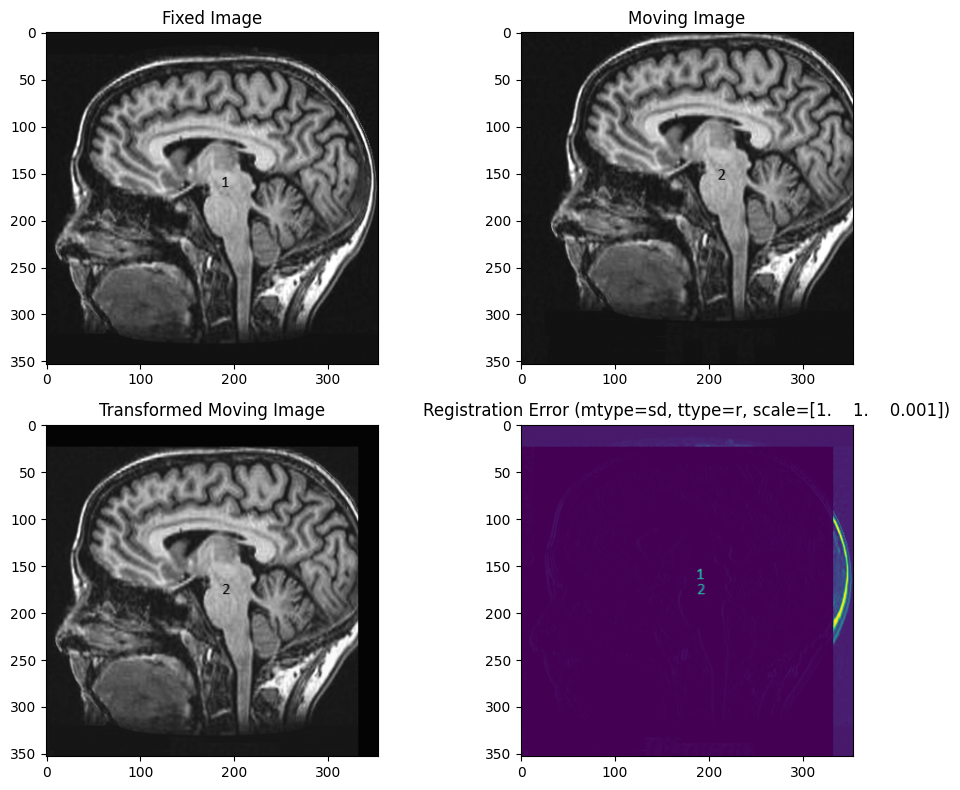


Registration took 8 sec.


In [6]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain2.png", "brain1.png", 'sd', 'r')
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

# Let's add some extra functionality to the framework

**TASK 1**: Add two new similarity metrics to the framework:

1.   Normalized cross-correlation (NCC)
2.   Normalized gradient correlation (NGC)

**TASK 2**: Modify the framework to be able to deal with full affine 2D transformations.
   - **QUESTION 4**: Justify how you initialize the transformation.

*Your answer here*



**TASK 3**: Implement the above modifications in a multi-resolution registration framework. The number of resolutions should be a parameter of the framework.
  - **QUESTION 5**: Discuss how each resolution is initialized.
  - **QUESTION 6**: Justify the benefits of multi-resolution in terms of computation time and/or accuracy of the final result, compared to a single resolution.

The resolution is initialize from tha fist image, then we are going to build the resolution pyramid with the levels given in the function.

The time is faster, since with very complicated images you can start with values that are near the images one, in the other hand there is an increase in accuraccy in the case that you don't exceed the levels on which your local minimum exits.



# Let's try your implementation

**TASK 4**: Show some registration results using brain1.png, brain2.png, brain3.png, and brain4.png with the different combinations of the registration framework: different <u>metrics</u>, <u>transformations</u> and <u>multi-resolution levels</u>.



Parameters: [-1.45304428e+01  1.64989237e+00  9.41721477e-04]
Error of Result: 5.51270%


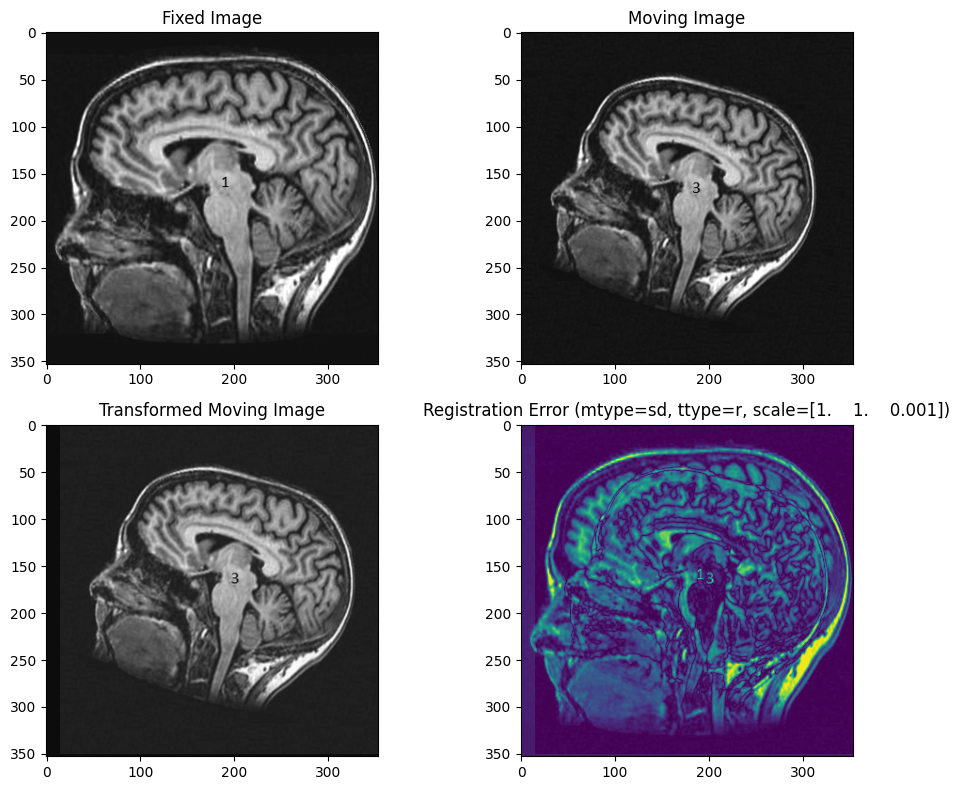


Registration took 2 sec.


In [7]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain3.png", "brain1.png", 'sd', 'r')
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-9.24404430e+02  6.75050549e+01 -3.67713260e-03]
Error of Result: 13.15589%


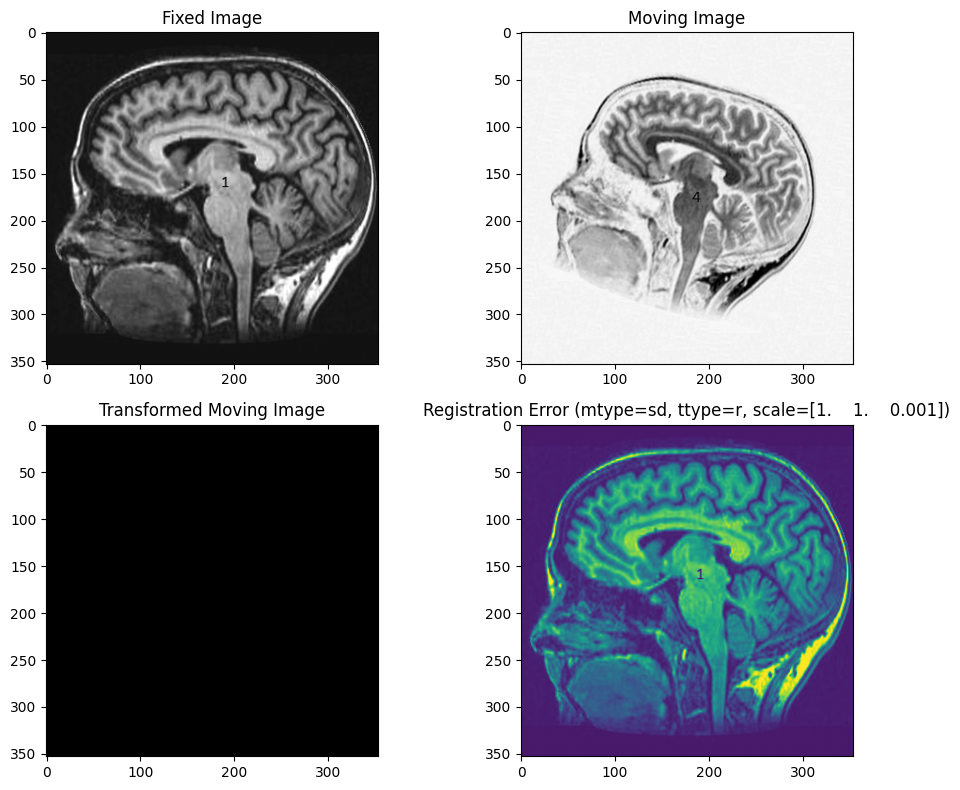


Registration took 3 sec.


In [14]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain4.png", "brain1.png", 'sd', 'r')
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

/tmp/ipykernel_6942/2755192301.py:33: RuntimeWarning: invalid value encountered in double_scalars
  e = 1 - numerator / np.sqrt( mult )


Parameters: [ 2.19980351e+01 -2.39978758e+01 -2.97743966e-06]
Error of Result: 0.38701%


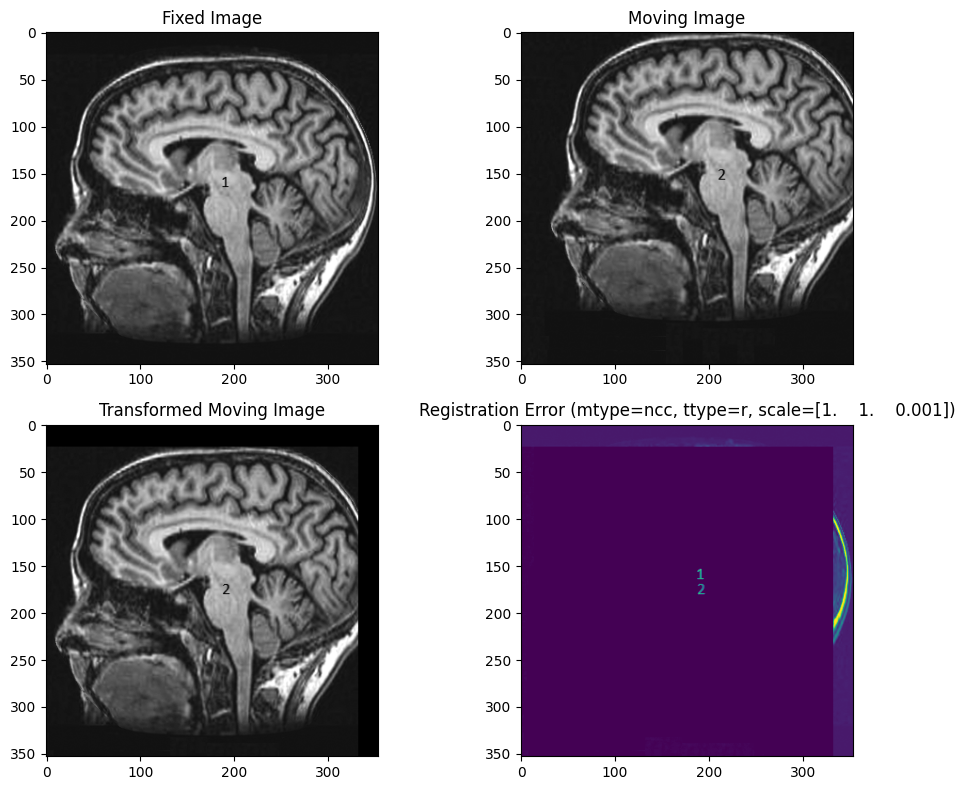


Registration took 4 sec.


In [15]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain2.png", "brain1.png", 'ncc', 'r')
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-11.47071958  -3.17155318  -0.32682461]
Error of Result: 5.36517%


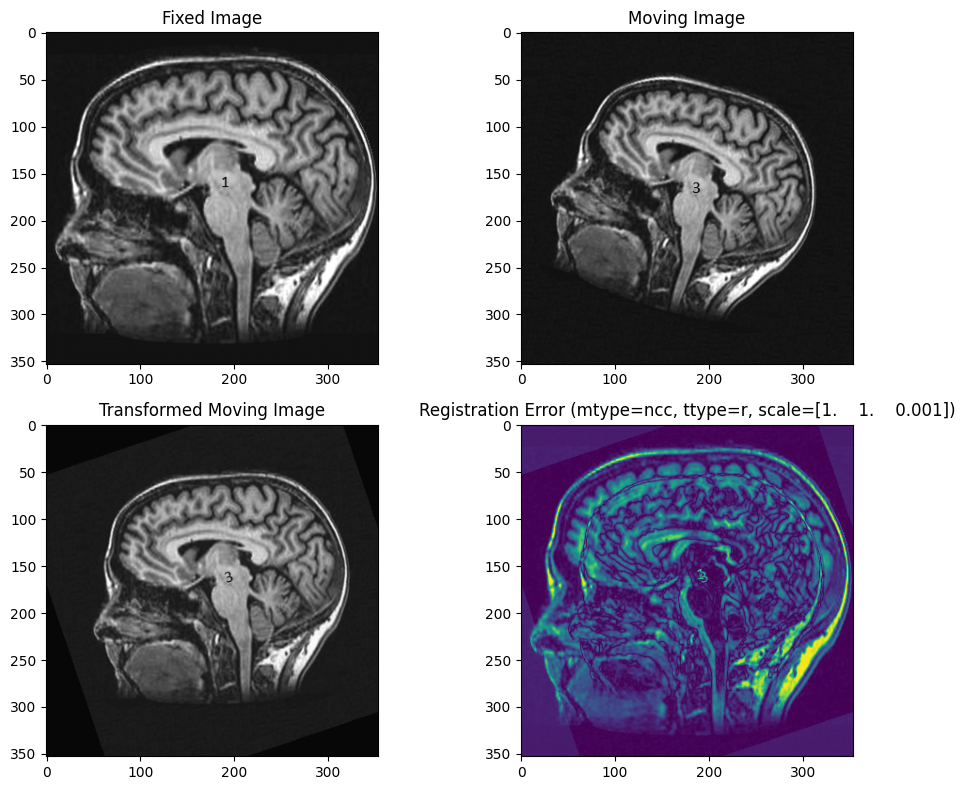


Registration took 9 sec.


In [16]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain3.png", "brain1.png", 'ncc', 'r')
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-3.58761194e+00 -2.32835237e+01  1.47660872e-02]
Error of Result: 32.80011%


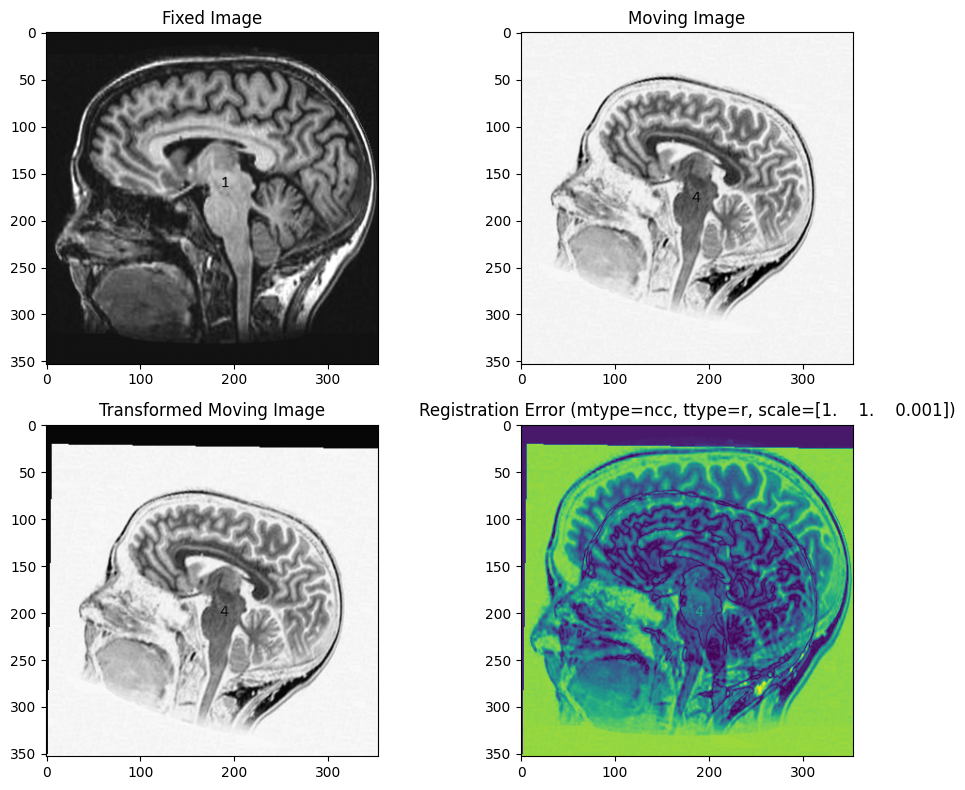


Registration took 4 sec.


In [17]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain4.png", "brain1.png", 'ncc', 'r')
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [0. 0. 0.]
Error of Result: 5.87440%


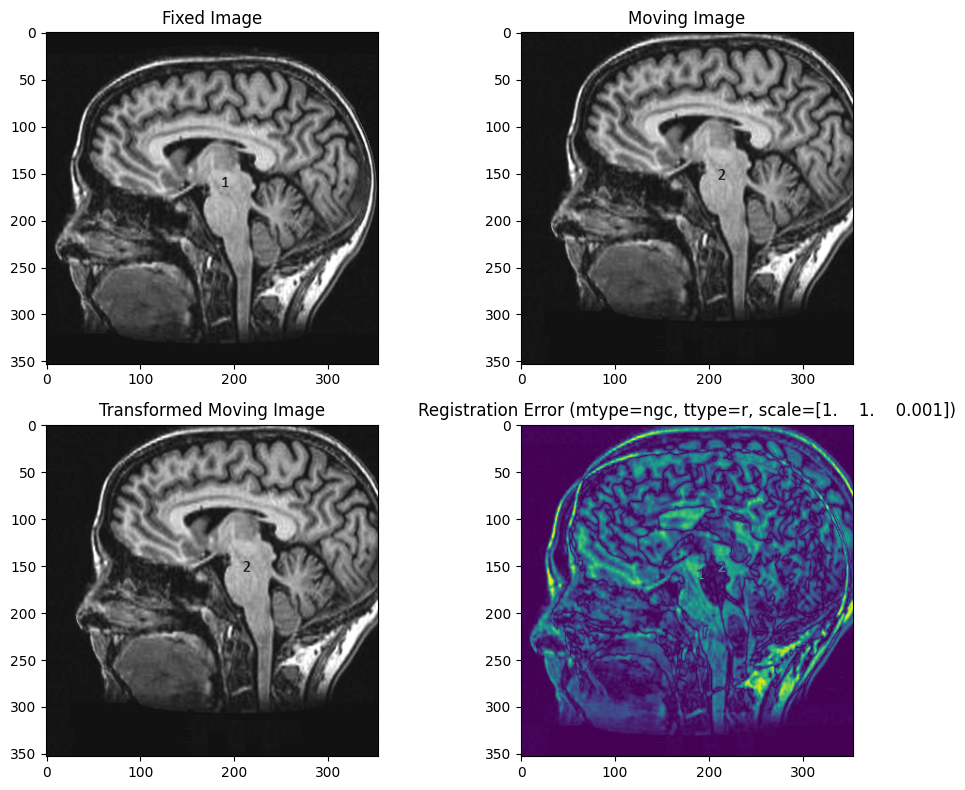


Registration took 1 sec.


In [18]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain2.png", "brain1.png", 'ngc', 'r')
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-11.47071958  -3.17155318  -0.32682461]
Error of Result: 5.36517%


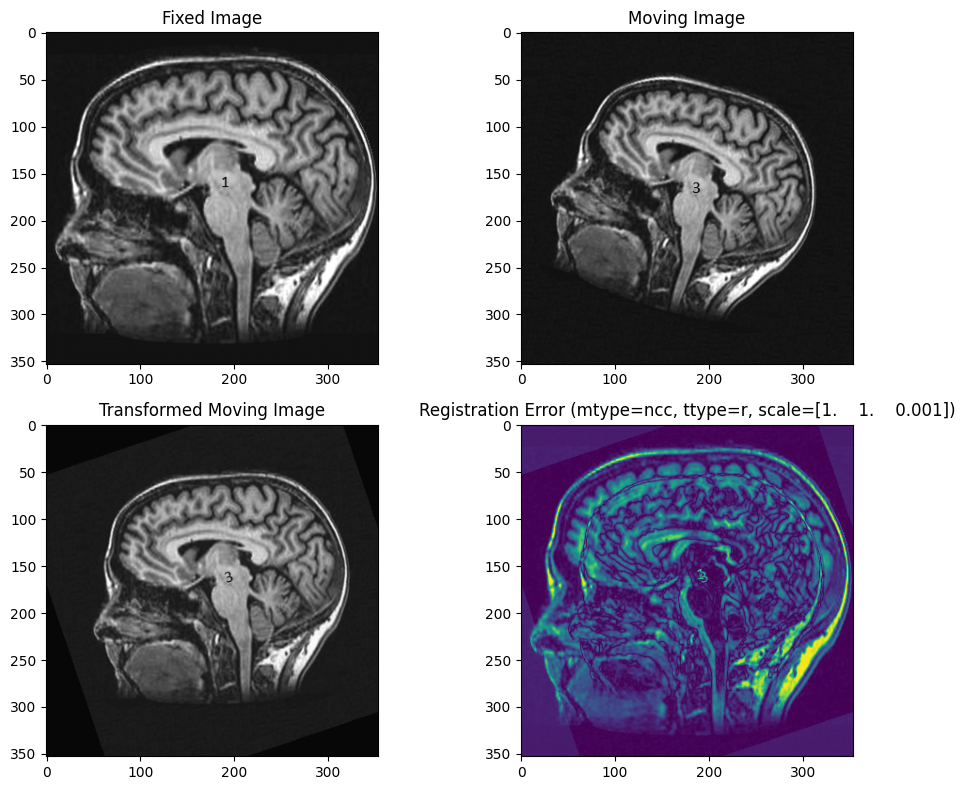


Registration took 10 sec.


In [19]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain3.png", "brain1.png", 'ngc', 'r')
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [0. 0. 0.]
Error of Result: 38.36309%


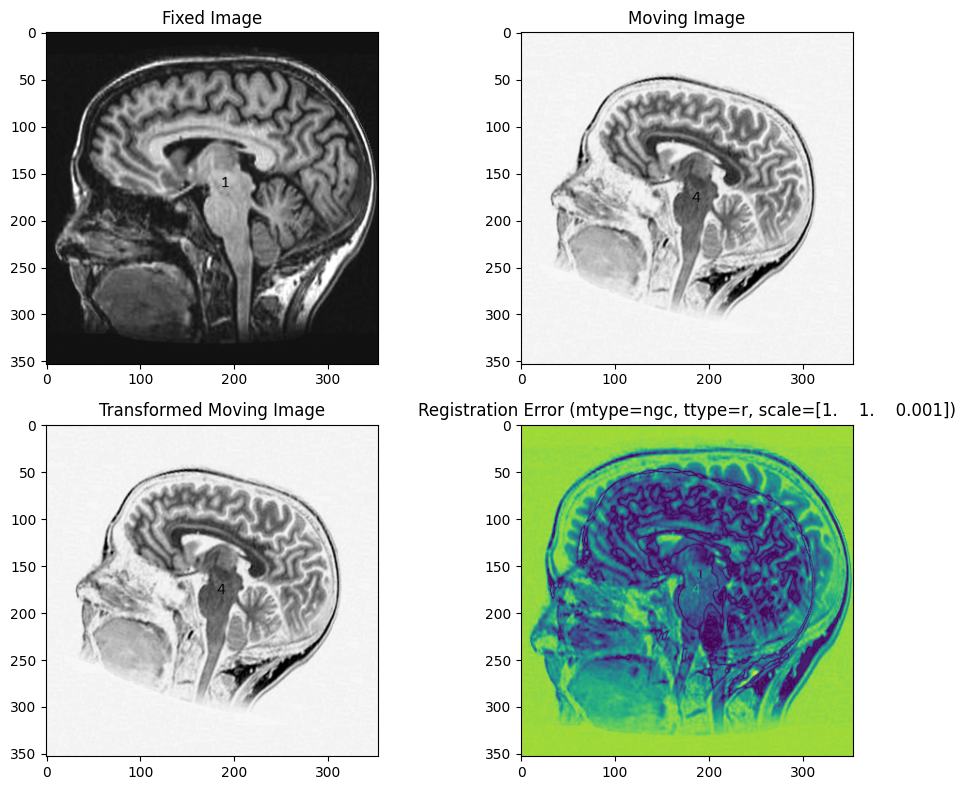


Registration took 1 sec.


In [20]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain4.png", "brain1.png", 'ngc', 'r')
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [ 0.11639445 -0.01892706 -0.07567796  1.11618677  1.09186232  0.01910605
 -0.11652706]
Error of Result: 4.87472%


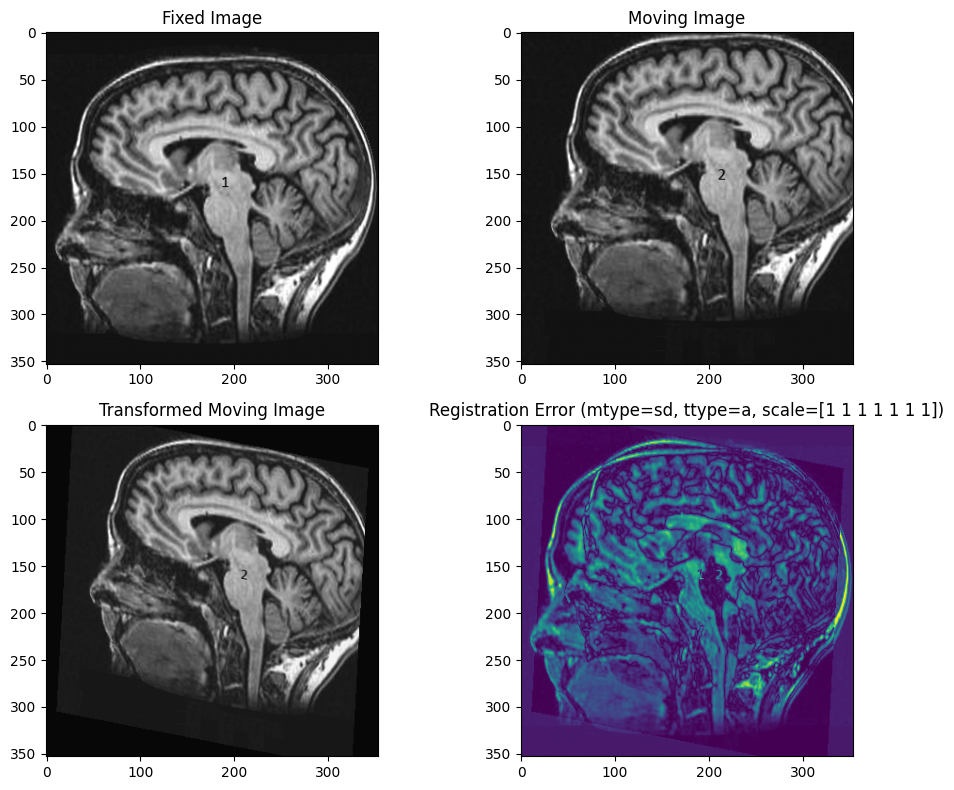


Registration took 9 sec.


In [21]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain2.png", "brain1.png", 'sd', 'a',np.array([1, 1, 1, 1, 1, 1, 1]))
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-4.58478633 -3.4760965   0.85252971  1.16117165  1.16260719 -0.64753059
 -0.64763752]
Error of Result: 0.11785%


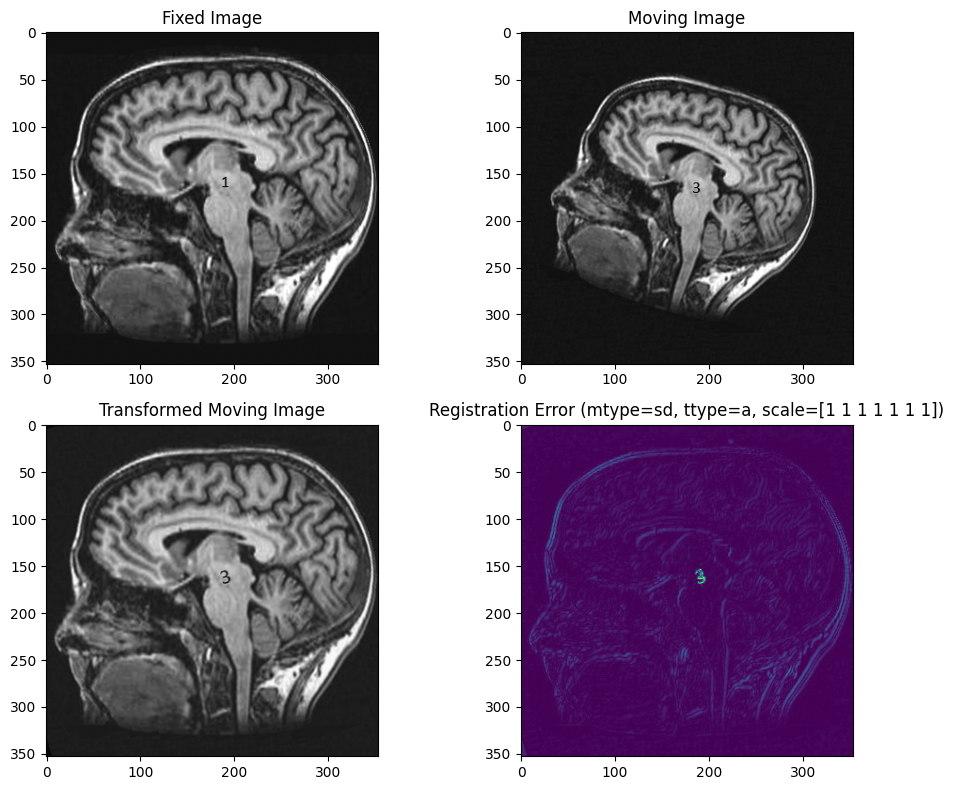


Registration took 12 sec.


In [22]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain3.png", "brain1.png", 'sd', 'a',np.array([1, 1, 1, 1, 1, 1, 1]))
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [0.20757441 0.20611296 0.7547824  2.22191476 2.0113889  0.56913031
 0.87230578]
Error of Result: 13.28717%


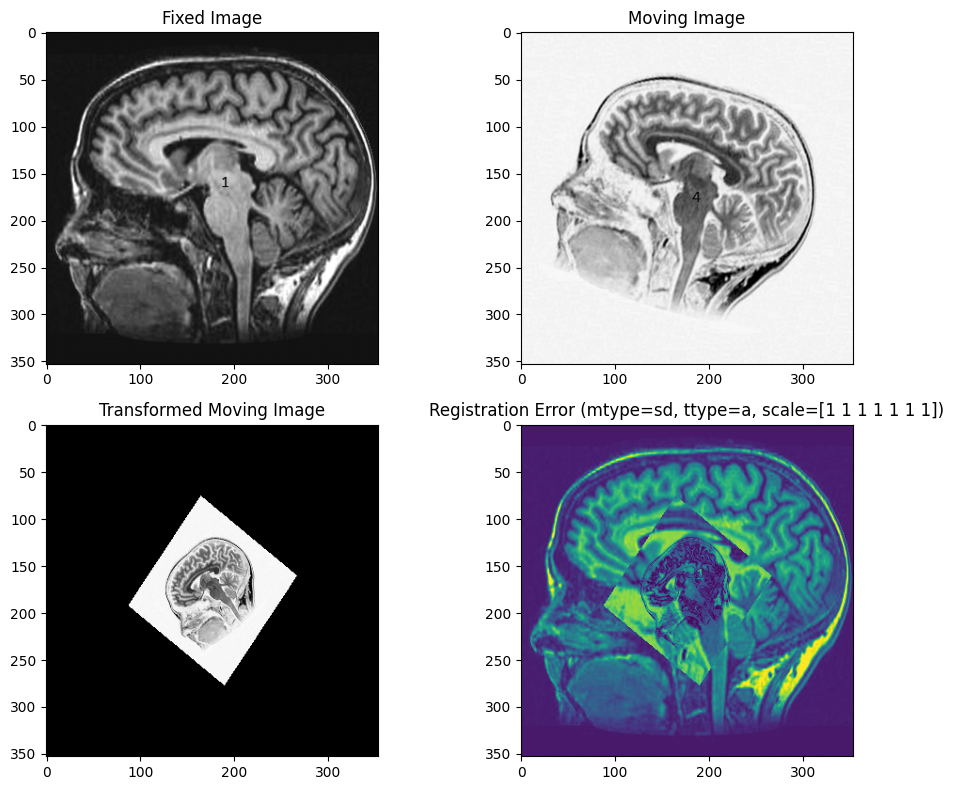


Registration took 4 sec.


In [23]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain4.png", "brain1.png", 'sd', 'a',np.array([1, 1, 1, 1, 1, 1, 1]))
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [ 0.17483913  0.03662768 -0.00168699  1.14723761  1.20992881  0.12581153
 -0.13131216]
Error of Result: 4.97387%


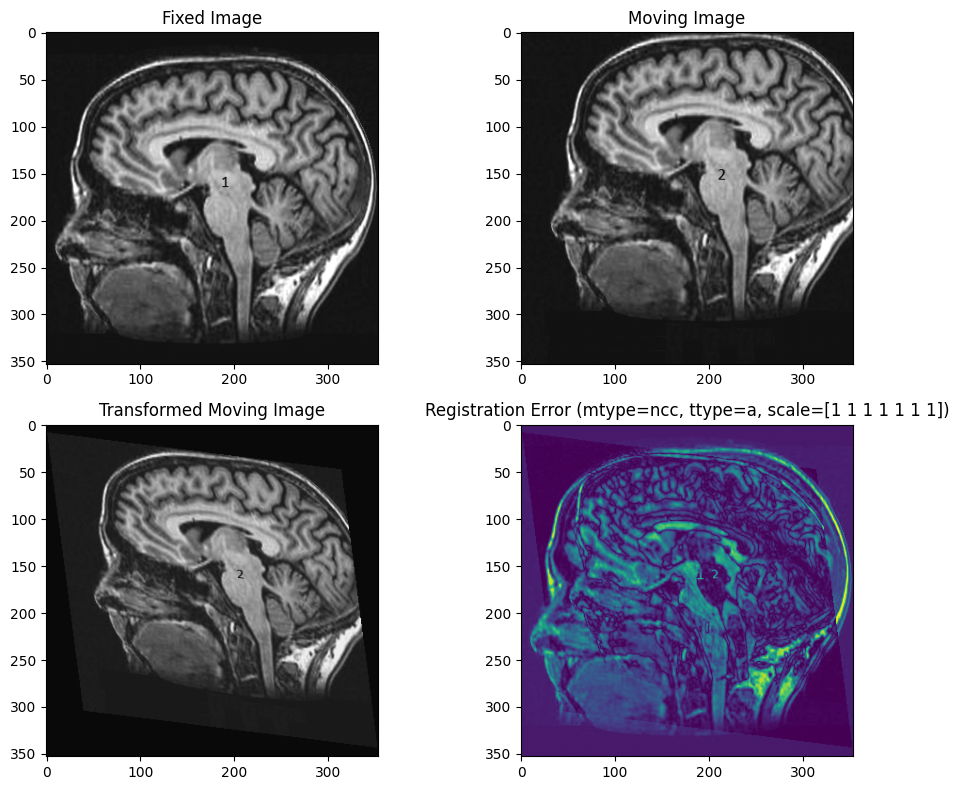


Registration took 5 sec.


In [24]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain2.png", "brain1.png", 'ncc', 'a',np.array([1, 1, 1, 1, 1, 1, 1]))
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-4.64459329 -4.17187806 -0.86237793  1.17240027  1.16663991  1.06644117
  1.06536007]
Error of Result: 0.11457%


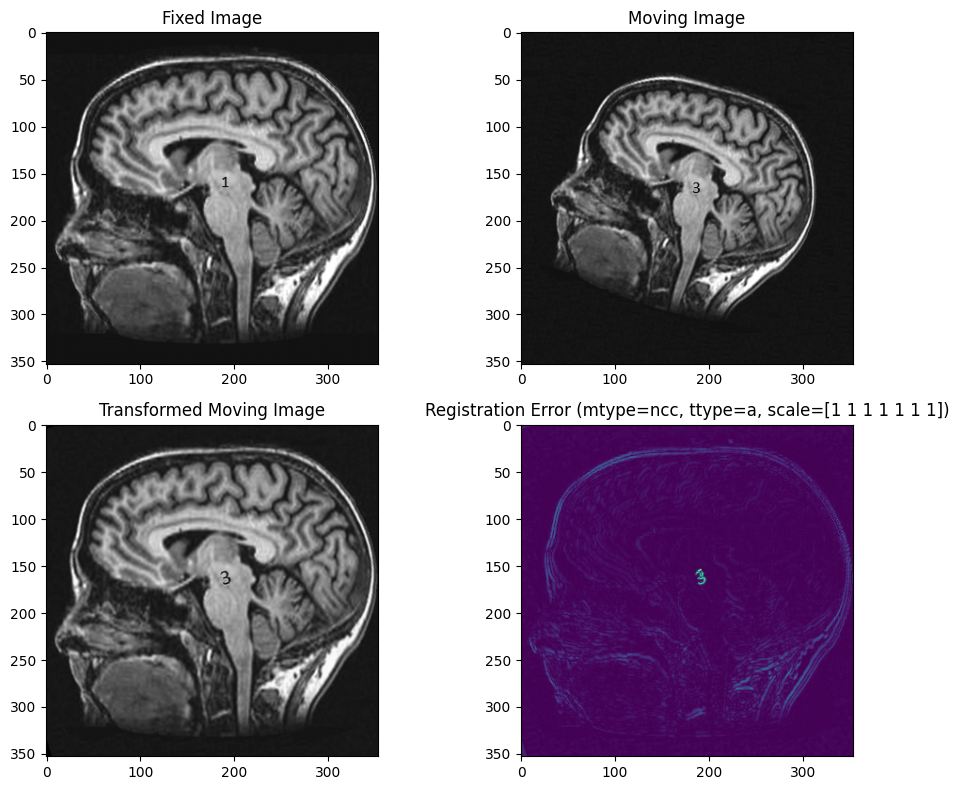


Registration took 18 sec.


In [26]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain3.png", "brain1.png", 'ncc', 'a',np.array([1, 1, 1, 1, 1, 1, 1]))
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [0.25218615 0.26233044 0.47922914 1.29464198 1.56966448 0.10774477
 0.42997519]
Error of Result: 14.83474%


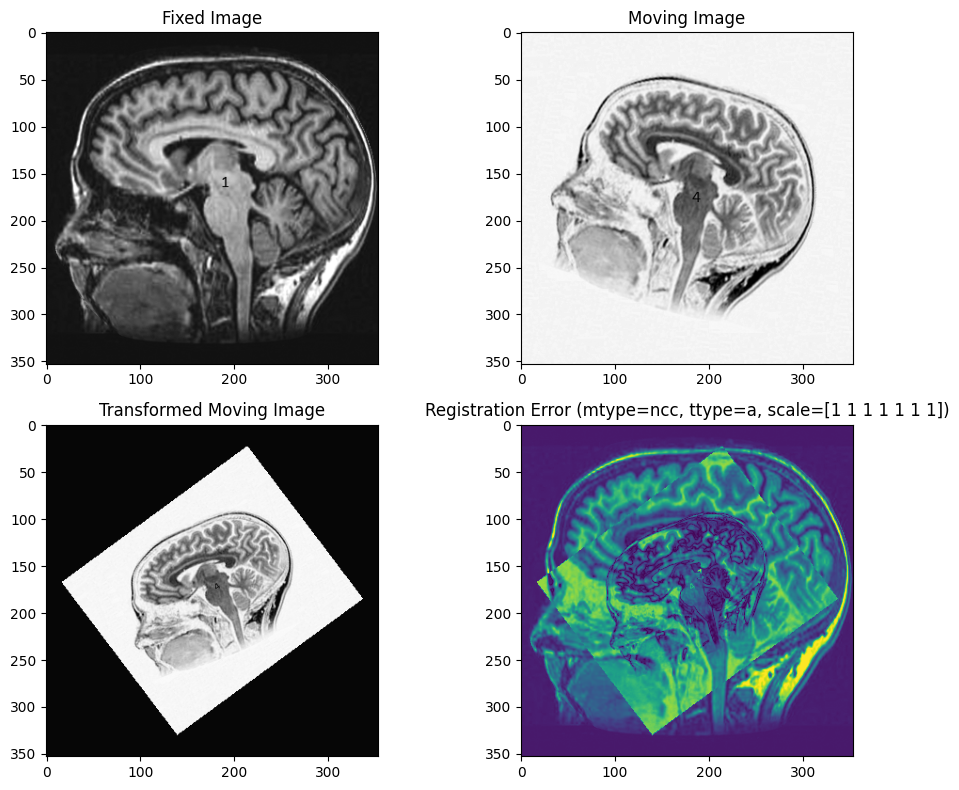


Registration took 5 sec.


In [27]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain4.png", "brain1.png", 'ncc', 'a',np.array([1, 1, 1, 1, 1, 1, 1]))
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-0.1954133  -0.0199352  -0.09828937  0.81698948  0.86985857 -0.07993242
 -0.021965  ]
Error of Result: 6.78511%


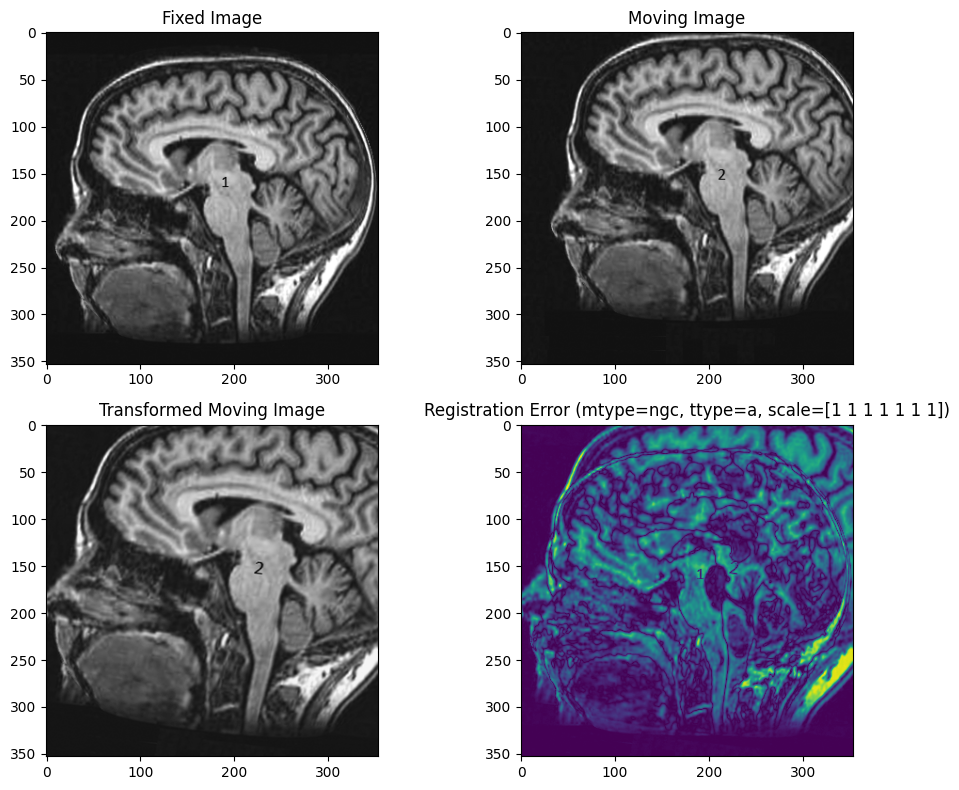


Registration took 5 sec.


In [28]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain2.png", "brain1.png", 'ngc', 'a',np.array([1, 1, 1, 1, 1, 1, 1]))
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-0.00294074 -0.02812497  0.10582746  0.77389556  0.84131086  0.01735709
  0.06400365]
Error of Result: 3.36548%


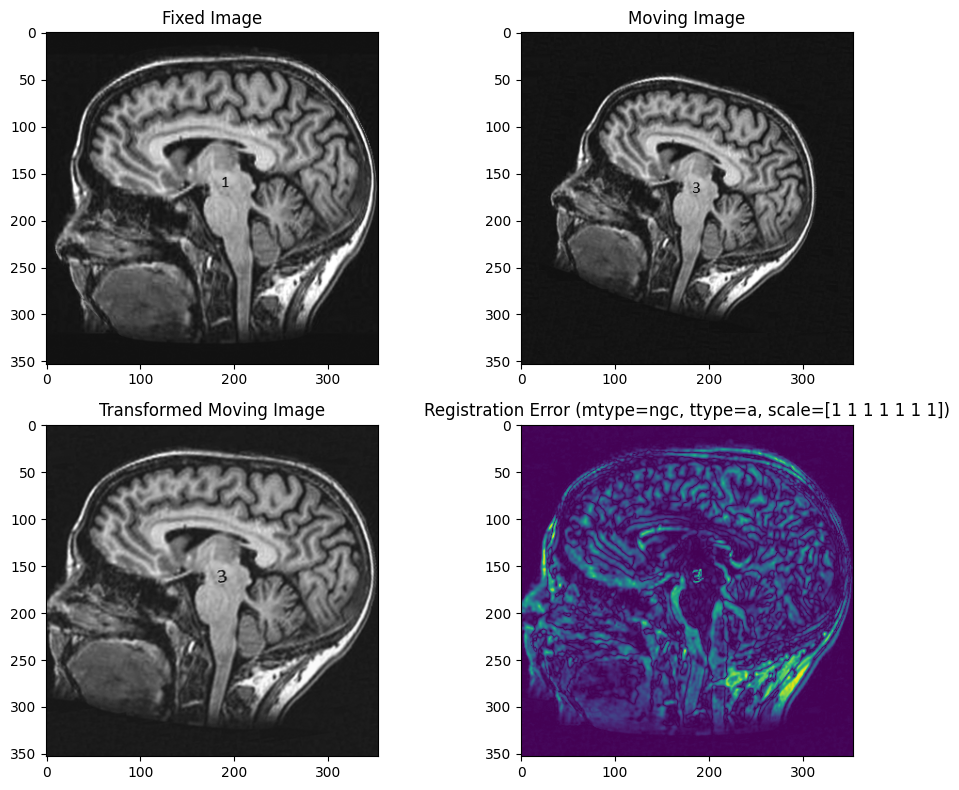


Registration took 13 sec.


In [29]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain3.png", "brain1.png", 'ngc', 'a',np.array([1, 1, 1, 1, 1, 1, 1]))
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-0.0758744  -0.0904213   0.11674381  0.77471347  0.84145733  0.00814348
  0.05600411]
Error of Result: 35.31423%


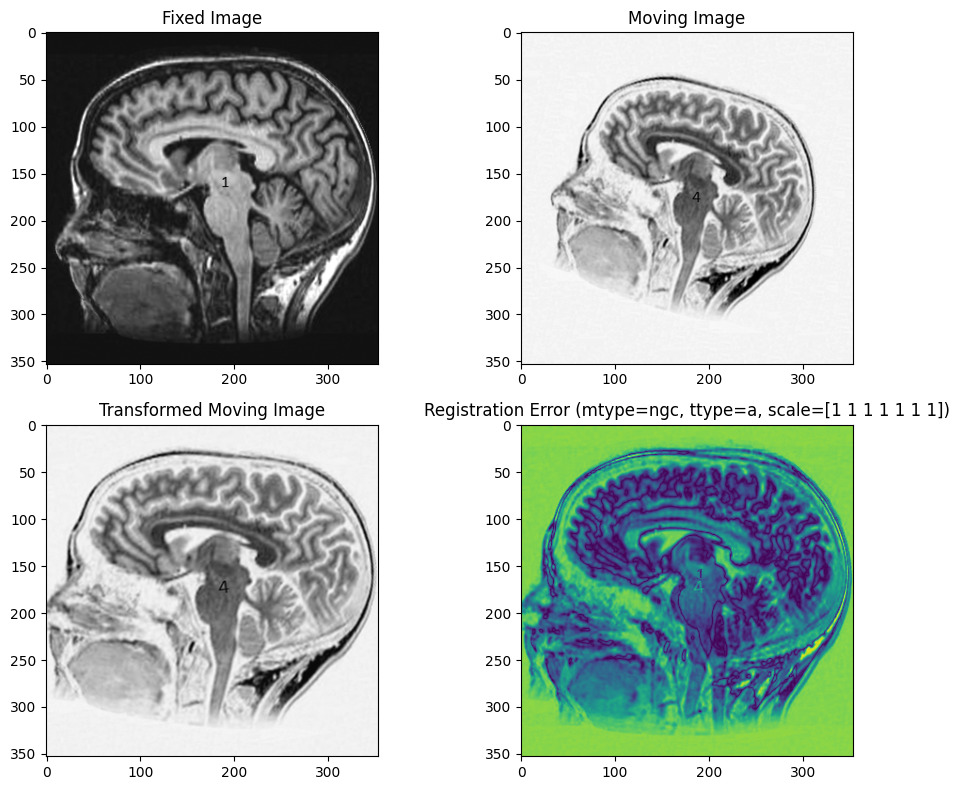


Registration took 13 sec.


In [30]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain4.png", "brain1.png", 'ngc', 'a',np.array([1, 1, 1, 1, 1, 1, 1]))
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

# Multi Resolution Affine Reg2D - sd - ttype='r'

Parameters: [ 5.46744078e+00 -5.98193966e+00 -5.43601015e-05]
Error of Result: 5.46546%


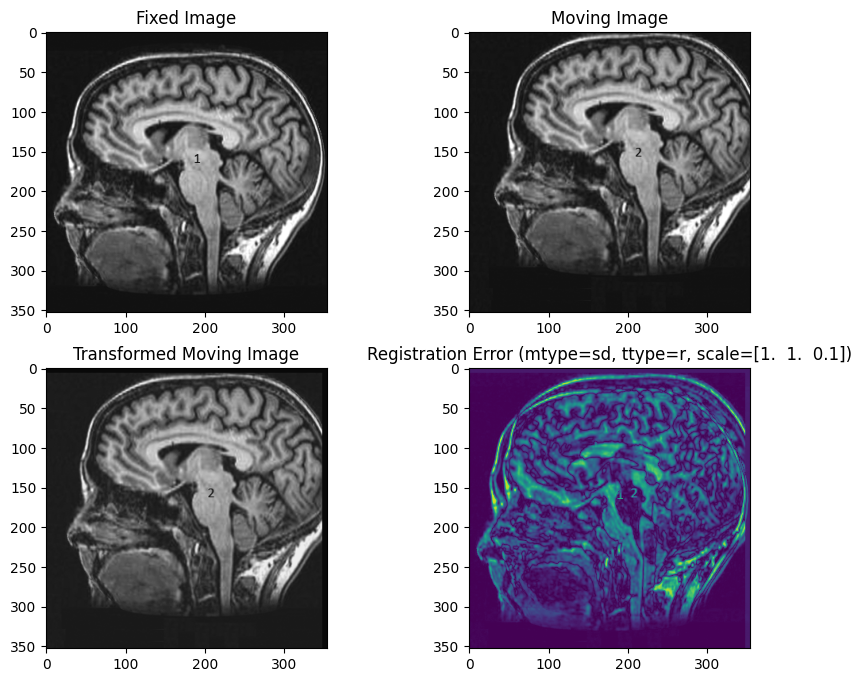

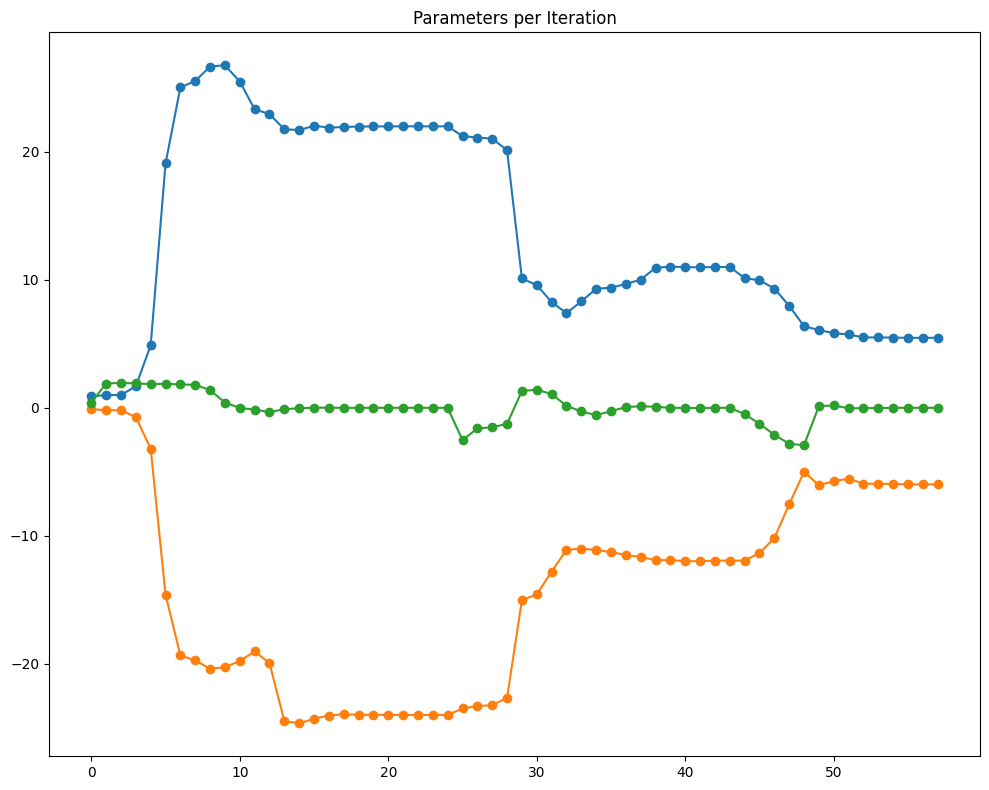


Registration took 8 sec.


In [34]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_resolution_affine_reg2D("brain2.png", "brain1.png", 'sd', 'r',num_levels=3,MidResultsOn=True)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-0.55144012  0.06432643 -0.31277386]
Error of Result: 5.57537%


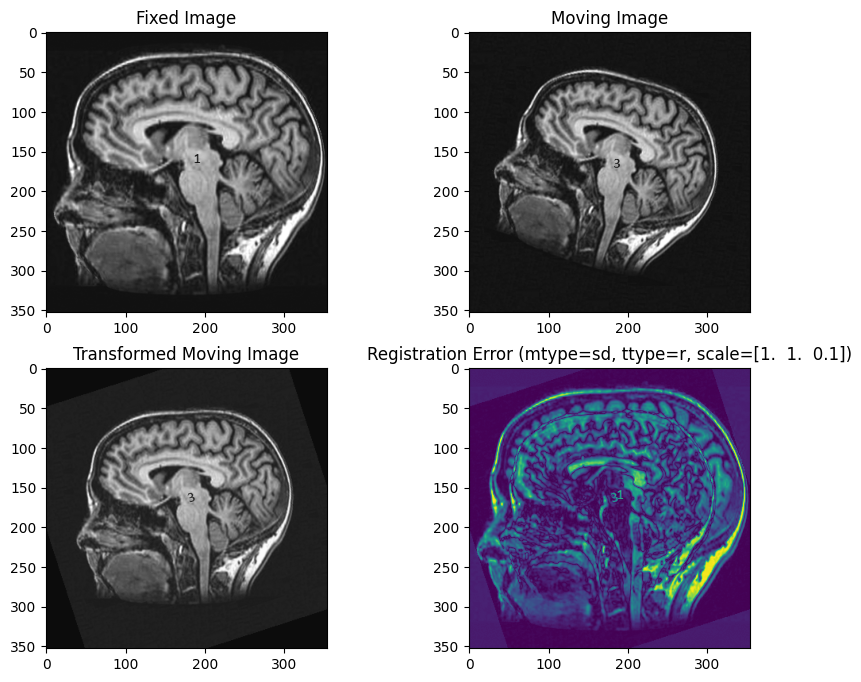

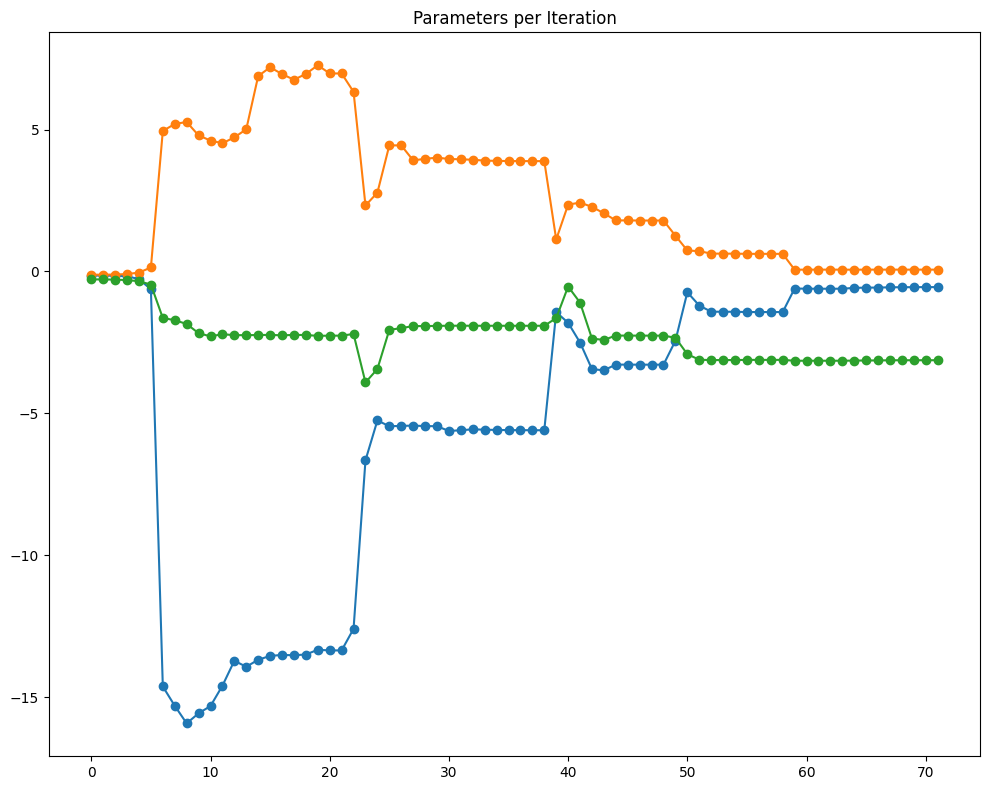


Registration took 6 sec.


In [35]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_resolution_affine_reg2D("brain3.png", "brain1.png", 'sd', 'r',num_levels=6,MidResultsOn=True)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [ 289.5588422  -175.3646919     0.69615002]
Error of Result: 16.53765%


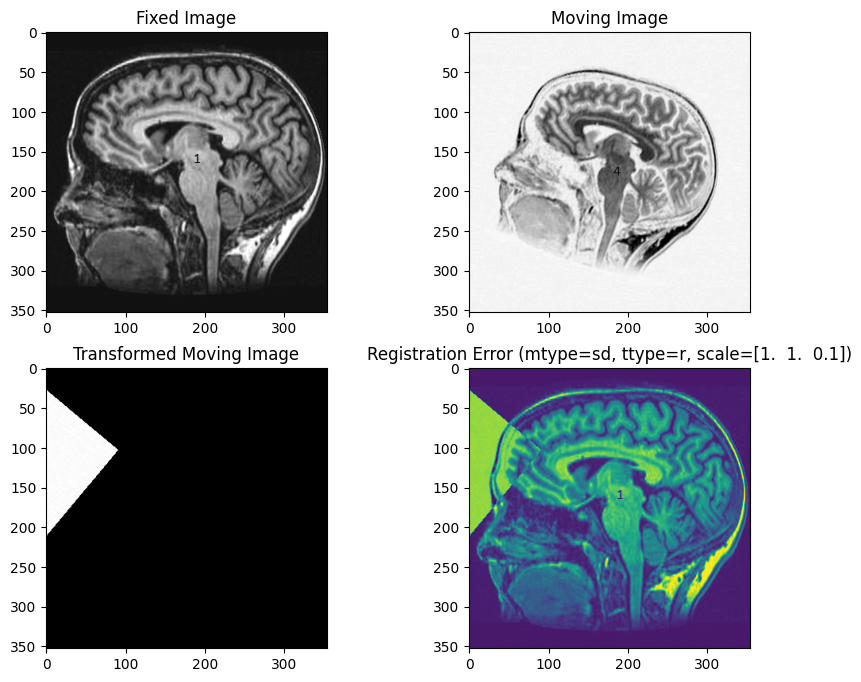

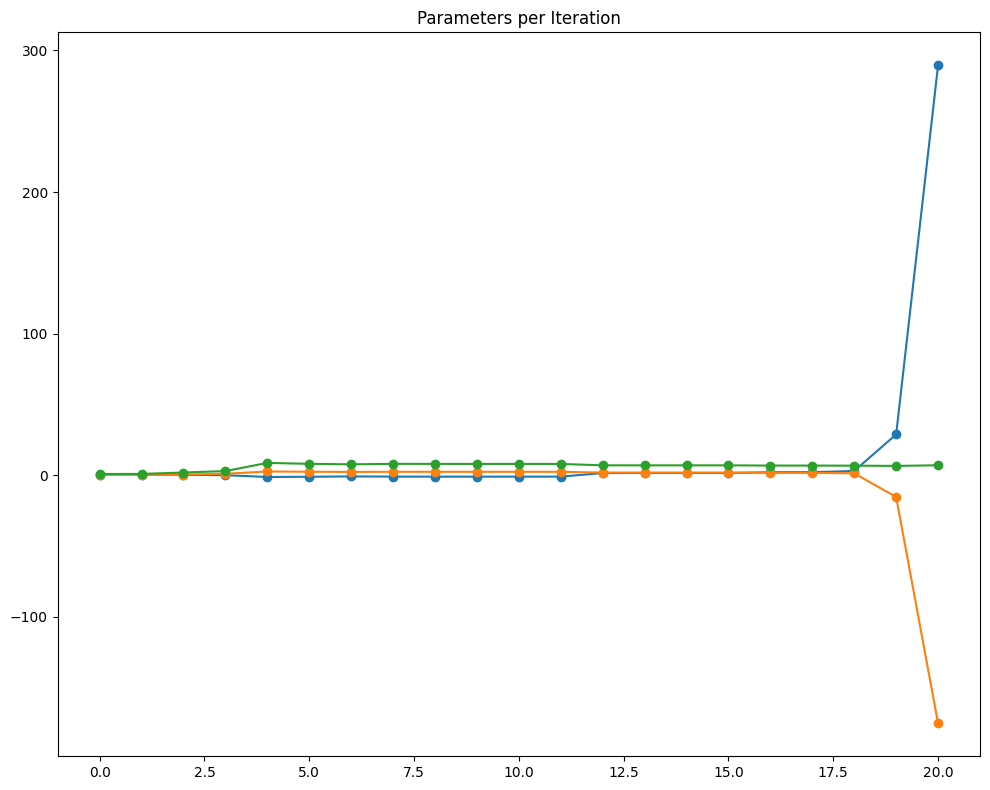


Registration took 5 sec.


In [38]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_resolution_affine_reg2D("brain4.png", "brain1.png", 'sd', 'r',num_levels=8,MidResultsOn=True)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

# Multi Resolution Affine Reg2D - ncc - ttype='r'

Parameters: [ 1.09980981e+01 -1.19590436e+01 -2.50248629e-05]
Error of Result: 4.73460%


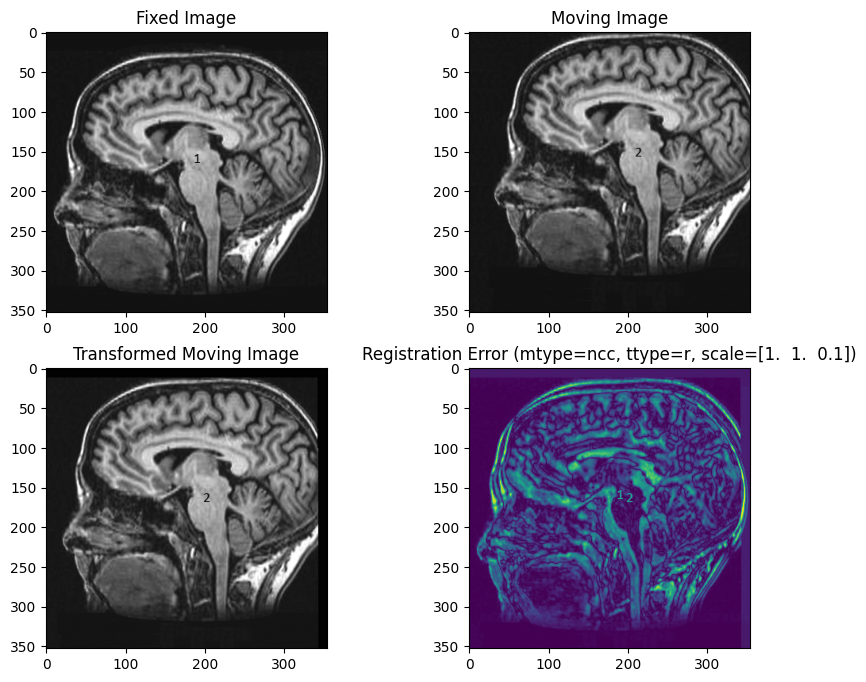

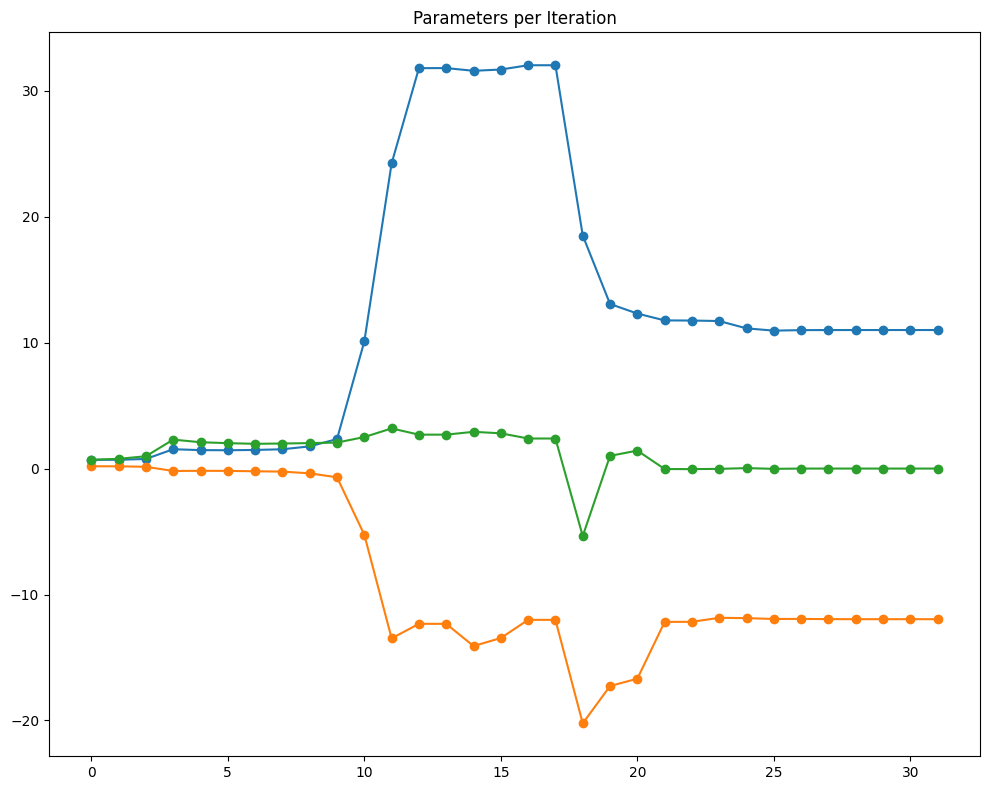


Registration took 6 sec.


In [42]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_resolution_affine_reg2D("brain2.png", "brain1.png", 'ncc', 'r',num_levels=3,MidResultsOn=True)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [-0.53909101  0.11141655 -0.35918366]
Error of Result: 5.50777%


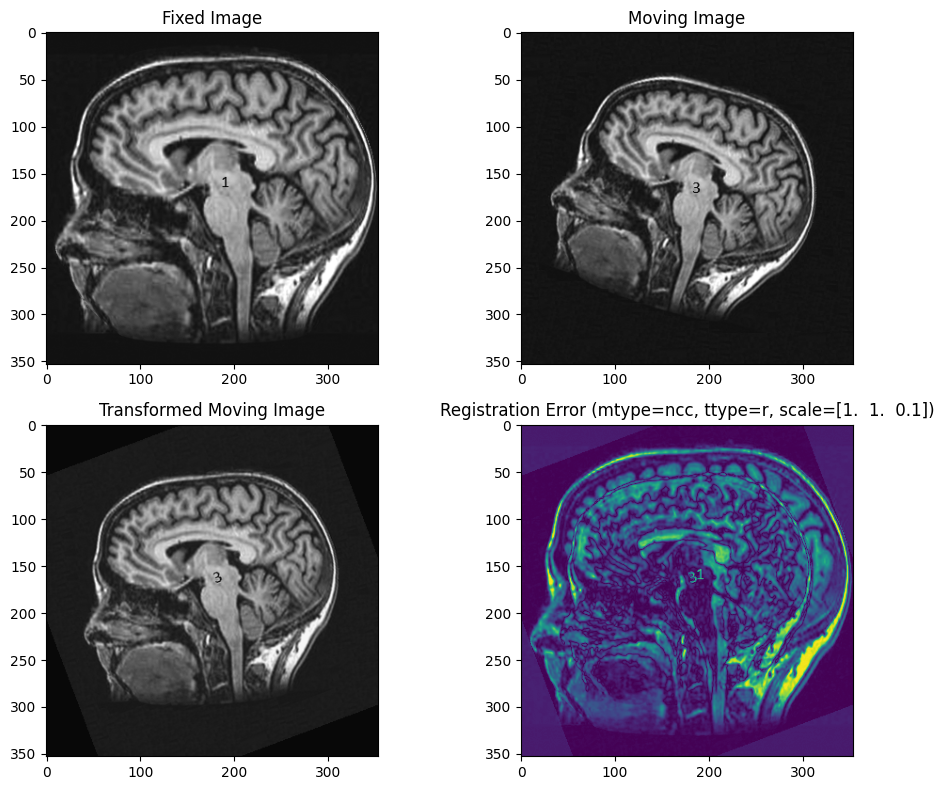


Registration took 5 sec.


In [46]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_resolution_affine_reg2D("brain3.png", "brain1.png", 'ncc', 'r',num_levels=6,MidResultsOn=False)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

/tmp/ipykernel_6942/2755192301.py:33: RuntimeWarning: invalid value encountered in double_scalars
  e = 1 - numerator / np.sqrt( mult )


Parameters: [  9.51152707 -32.69277764  -0.76031764]
Error of Result: 25.14087%


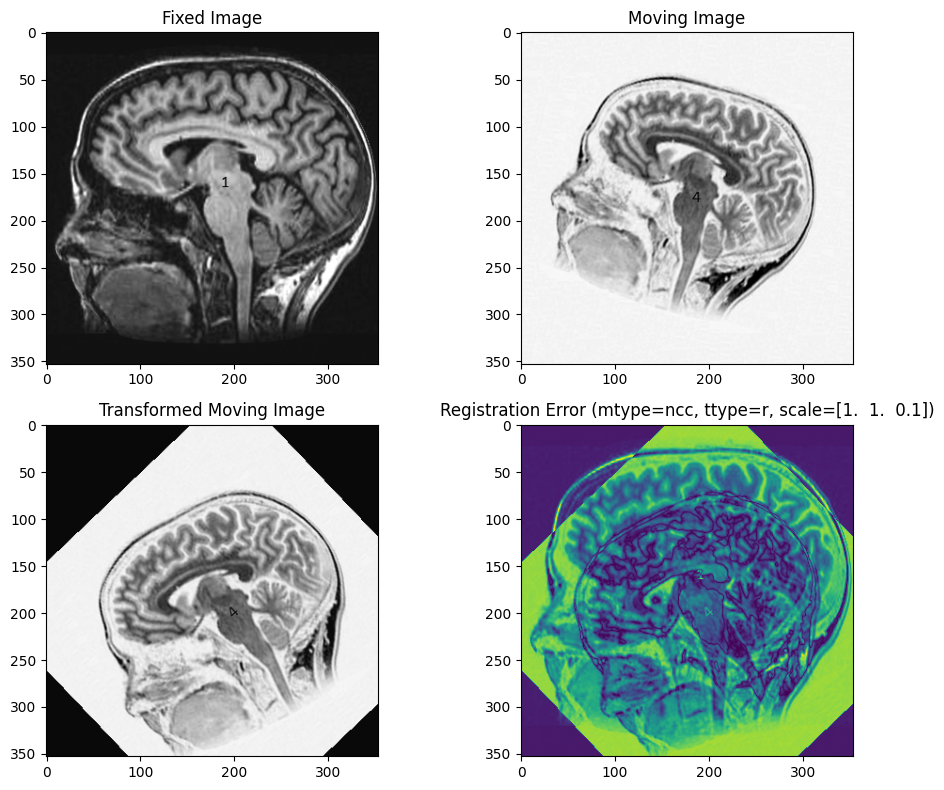


Registration took 7 sec.


In [48]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_resolution_affine_reg2D("brain4.png", "brain1.png", 'ncc', 'r',num_levels=7,MidResultsOn=False)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

# Multi Resolution Affine Reg2D - ngc - ttype='r'

/tmp/ipykernel_6942/2755192301.py:42: RuntimeWarning: invalid value encountered in double_scalars
  e = 1 - np.sum(p) / np.sqrt(np.sum(e1) * np.sum(e2))


Parameters: [-0.00504898 -0.00705787  0.00861606]
Error of Result: 5.85045%


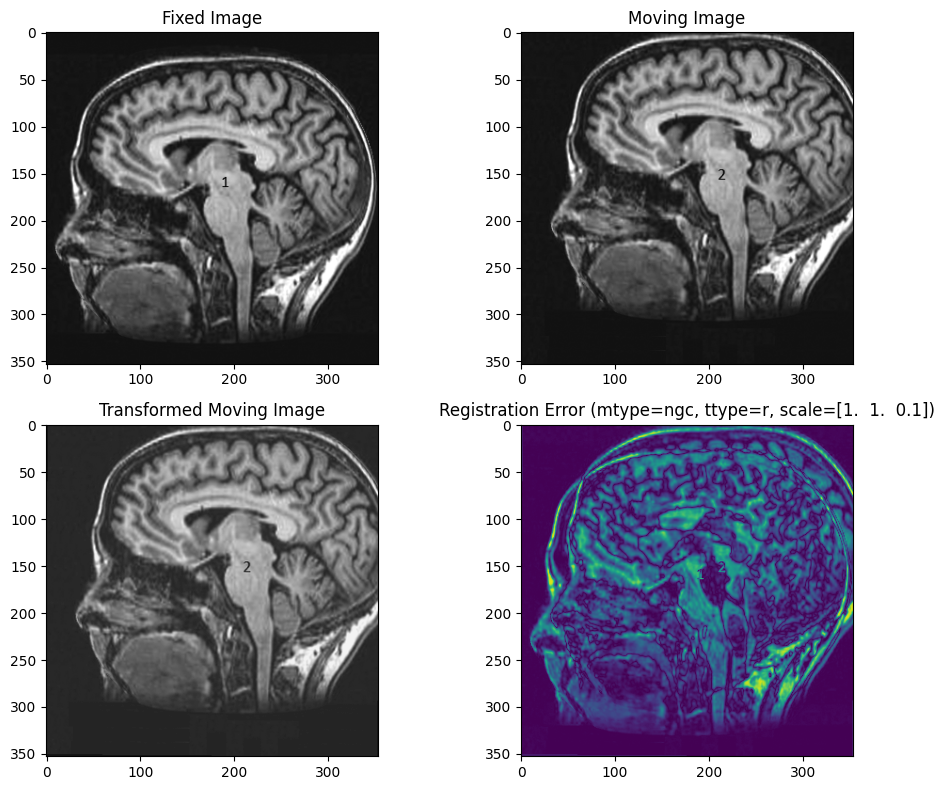


Registration took 3 sec.


In [50]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_resolution_affine_reg2D("brain2.png", "brain1.png", 'ngc', 'r',num_levels=8,MidResultsOn=False)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

/tmp/ipykernel_6942/2755192301.py:42: RuntimeWarning: invalid value encountered in double_scalars
  e = 1 - np.sum(p) / np.sqrt(np.sum(e1) * np.sum(e2))


Parameters: [-0.33045666  0.17533069 -0.25546567]
Error of Result: 5.69321%


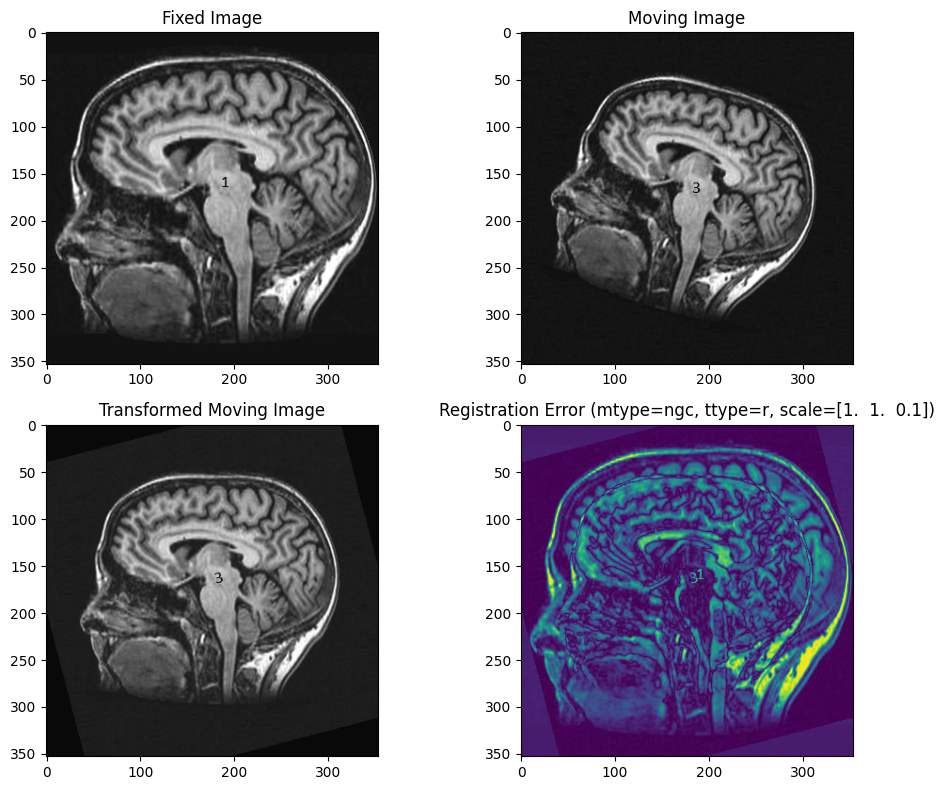


Registration took 4 sec.


In [51]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_resolution_affine_reg2D("brain3.png", "brain1.png", 'ngc', 'r',num_levels=8,MidResultsOn=False)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

Parameters: [ 0.76130479 -0.77619263 -0.14000341]
Error of Result: 33.78648%


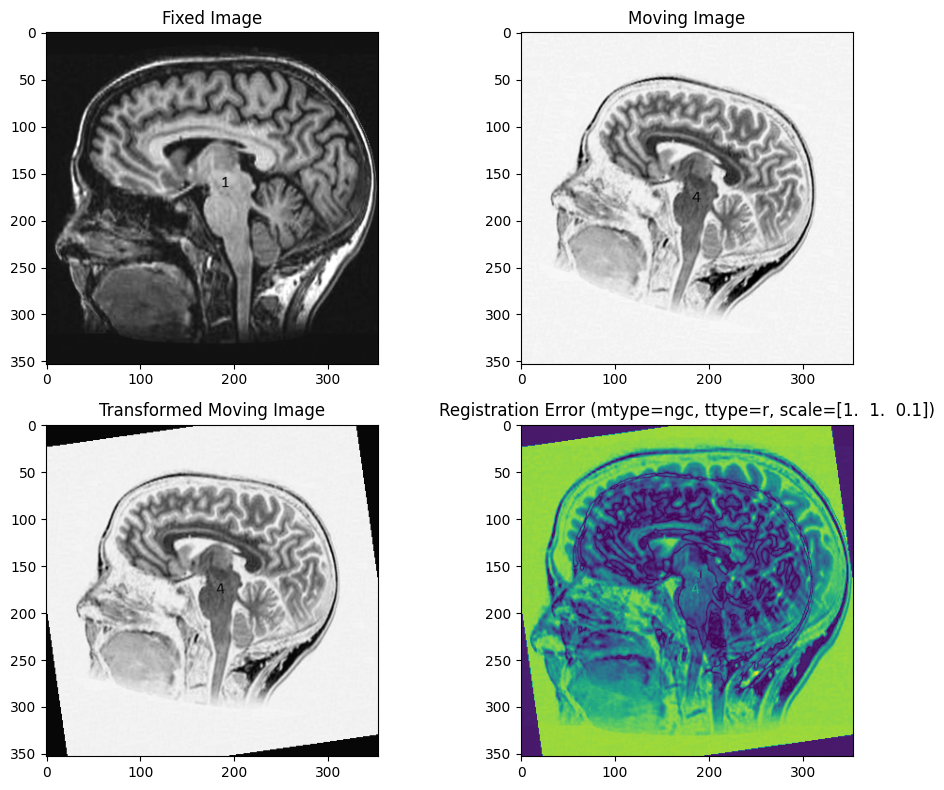


Registration took 2 sec.


In [52]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_resolution_affine_reg2D("brain4.png", "brain1.png", 'ngc', 'r',num_levels=8,MidResultsOn=False)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

**TASK 5**: For selected (representative) cases, plot the metric against iterations, computation time, registration results and final error (<u>propose a quantitative error measure</u>).

In [13]:
#Your code here




**QUESTION 7**: Are the results what you were expecting? If not, explain why.

*Your answer here*